In [1]:
!pip install py3dep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.3/218.3 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 51.9 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.4/289.4 kB 18.0 MB/s eta 0:00:00


In [4]:
import numpy as np
import pandas as pd
import geopandas as gpd
import scipy
from dask.distributed import Client
#import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr
from datetime import datetime
#import ulmo
from datetime import datetime
import sys
import contextily as ctx
import rioxarray as rxr
#from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib
import matplotlib.transforms as mtransforms
import logging
import ipyleaflet
import planetary_computer
import requests
from IPython.display import Image
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils

In [27]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
sys.modules.pop('s1_rtc_bs_utils')
import s1_rtc_bs_utils

In [5]:
gj = 'test.geojson'
bbox_gdf = gpd.read_file(gj)

In [23]:
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2022-01-01',end_time='2022-10-01',polarization='all',resolution=20)

In [21]:
#ts_ds = ts_ds.compute()
#ts_ds = ts_ds.dropna('time',how='all')

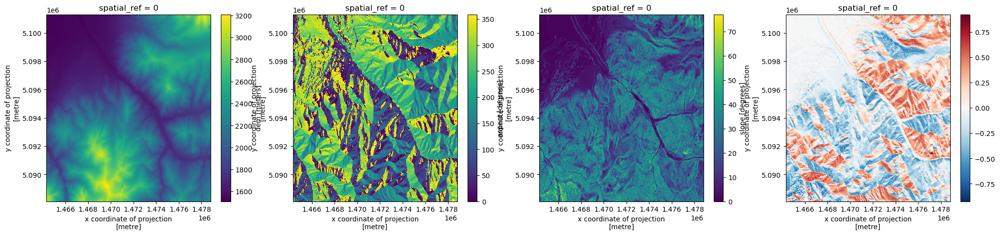

In [6]:
f,ax=plt.subplots(1,4,figsize=(25,5))
s1_rtc_bs_utils.get_py3dep_dem(ts_ds).plot(ax=ax[0])
s1_rtc_bs_utils.get_py3dep_aspect(ts_ds).plot(ax=ax[1])
s1_rtc_bs_utils.get_py3dep_slope(ts_ds).plot(ax=ax[2])
s1_rtc_bs_utils.get_dah(ts_ds).plot(ax=ax[3])

In [28]:
runoff = s1_rtc_bs_utils.get_runoff_onset(ts_ds,return_seperate_orbits_and_polarizations=False)

In [29]:
runoff

<xarray.DataArray 'time' (y: 1149, x: 1262)>
dask.array<astype, shape=(1149, 1262), dtype=datetime64[ns], chunksize=(1149, 1262), chunktype=numpy.ndarray>
Coordinates: (12/26)
  * x                                      (x) float64 1.464e+06 ... 1.479e+06
  * y                                      (y) float64 5.101e+06 ... 5.088e+06
    sar:looks_azimuth                      int64 1
    sar:frequency_band                     <U1 'C'
    s1:resolution                          <U4 'high'
    s1:processing_level                    <U1 '1'
    ...                                     ...
    sar:looks_range                        int64 5
    proj:epsg                              int64 32612
    sar:looks_equivalent_number            float64 4.4
    sat:orbit_state                        <U10 'descending'
    raster:bands                           object {'nodata': -32768, 'data_ty...
    epsg                                   int64 32610

/srv/conda/envs/notebook/lib/python3.10/site-packages/dask/array/reductions.py:1074: RuntimeWarning: All-NaN slice encountered
  vals = func(x, axis=arg_axis, keepdims=True)


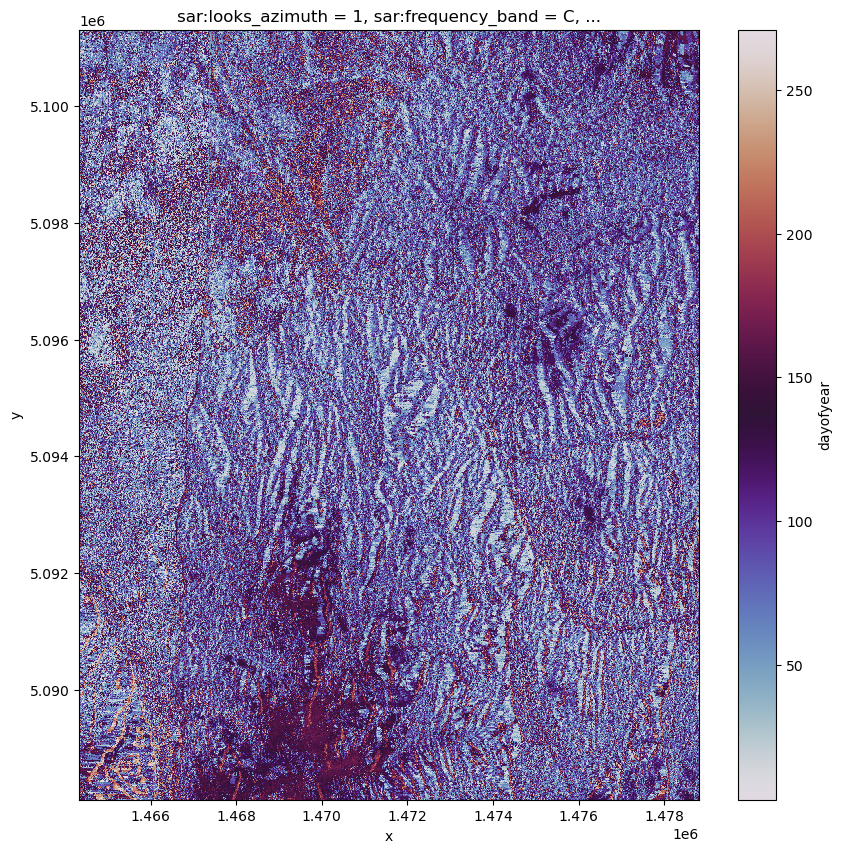

In [30]:
f,ax=plt.subplots(figsize=(10,10))
runoff.dt.dayofyear.plot(ax=ax,cmap='twilight')

In [31]:
runoffs = s1_rtc_bs_utils.get_runoff_onset(ts_ds,return_seperate_orbits_and_polarizations=True)

/srv/conda/envs/notebook/lib/python3.10/site-packages/dask/array/reductions.py:1074: RuntimeWarning: All-NaN slice encountered
  vals = func(x, axis=arg_axis, keepdims=True)


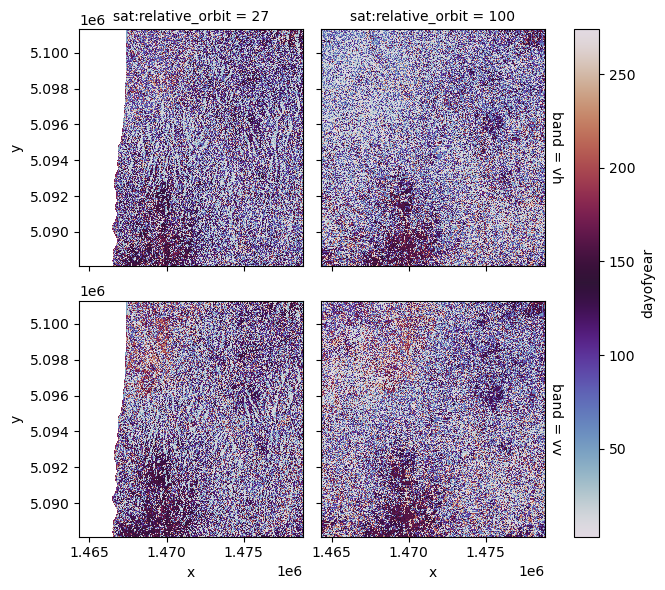

In [33]:
runoffs.dt.dayofyear.plot(col='sat:relative_orbit',row='band',cmap='twilight')

In [9]:
names = ['Mill Creek']
geojsons = ['test.geojson']

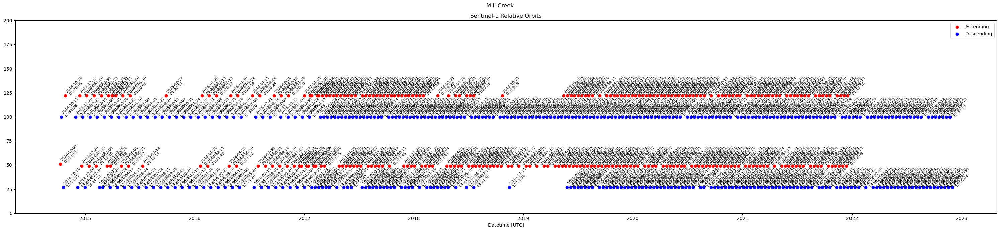

In [10]:
for nm, gj in zip(names,geojsons):
    bbox_gdf = gpd.read_file(gj)
    ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2014-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),polarization='vv')
    #ts_ds = ts_ds.compute()
    #ts_ds = ts_ds.dropna('time',how='all')
    
    f,ax=plt.subplots(figsize=(30,7))
    
    s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)
    f.suptitle(f'{nm}')
    plt.tight_layout()

In [13]:
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2014-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),polarization='vv')
ts_ds = ts_ds.compute()
ts_ds = ts_ds.dropna('time',how='all')

In [17]:
summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds,start_time='2019-07-30',end_time='2019-09-09')

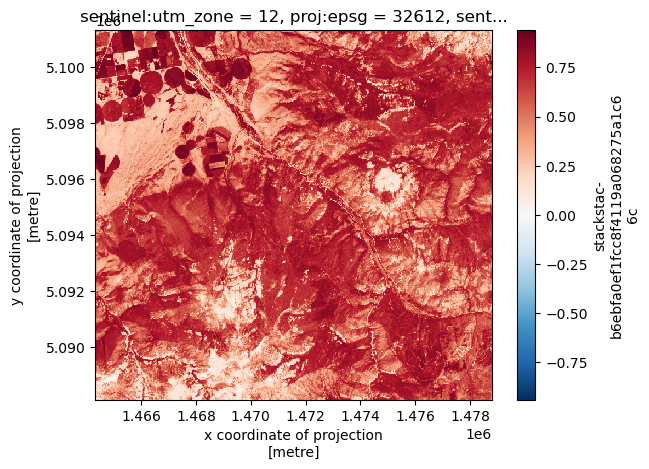

In [18]:
f,ax=plt.subplots()
summer_ndvi_ds.plot(ax=ax)

In [20]:
resample_freq_s1='2W'
millcreek_sar_2w_ds = ts_ds.where(summer_ndvi_ds.values<0.2).resample(time='2W').mean(dim='time')
millcreek_sar_2w_ds.rio.write_crs(ts_ds.crs)
dem = s1_rtc_bs_utils.get_py3dep_dem(ts_ds)

/srv/conda/envs/notebook/lib/python3.10/site-packages/flox/aggregate_flox.py:105: RuntimeWarning: invalid value encountered in true_divide
  out /= nanlen(group_idx, array, size=size, axis=axis, fill_value=0)


In [ ]:
f,ax=plt.subplots(4,2,figsize=(24,18),gridspec_kw={'width_ratios': [1, 8]})
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[0,1],normalize_bins=True)

Text(0.5, 0.98, 'Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin \n top 2 rows are all data, bottom 2 rows are 2 week resampled means')

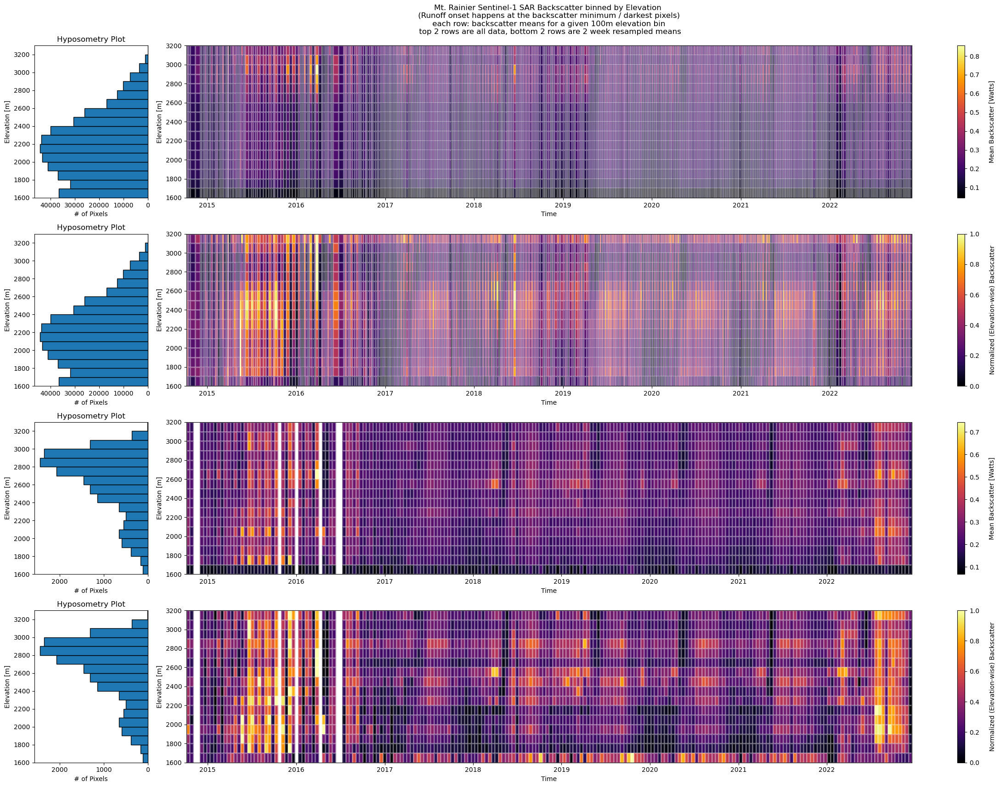

In [27]:
f,ax=plt.subplots(4,2,figsize=(24,18),gridspec_kw={'width_ratios': [1, 8]})
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[0,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(ts_ds,dem,bin_size=100,ax=ax[1,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(ts_ds,dem,bin_size=100,ax=ax[0,0])
s1_rtc_bs_utils.plot_hyposometry(ts_ds,dem,bin_size=100,ax=ax[1,0])
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(millcreek_sar_2w_ds,dem,bin_size=100,ax=ax[2,1],normalize_bins=False)
s1_rtc_bs_utils.plot_timeseries_by_elevation_bin(millcreek_sar_2w_ds,dem,bin_size=100,ax=ax[3,1],normalize_bins=True)
s1_rtc_bs_utils.plot_hyposometry(millcreek_sar_2w_ds,dem.where(summer_ndvi_ds.values<0.2),bin_size=100,ax=ax[2,0])
s1_rtc_bs_utils.plot_hyposometry(millcreek_sar_2w_ds,dem.where(summer_ndvi_ds.values<0.2),bin_size=100,ax=ax[3,0])
ax[0,0].invert_xaxis()
ax[1,0].invert_xaxis()
ax[2,0].invert_xaxis()
ax[3,0].invert_xaxis()
#plt.tight_layout()
f.tight_layout(rect=[0, 0.03, 1, 0.95])
f.suptitle("Mt. Rainier Sentinel-1 SAR Backscatter binned by Elevation \n (Runoff onset happens at the backscatter minimum / darkest pixels) \n each row: backscatter means for a given 100m elevation bin \n top 2 rows are all data, bottom 2 rows are 2 week resampled means")